In [2]:
#进入算法库源码目录
%cd mmdetection

/root/autodl-tmp/pythonProject/openmmlab_ai/MMDetection_homework/mmdetection


# 1 数据集准备和可视化
气球数据集已下载，放在data/balloon目录中

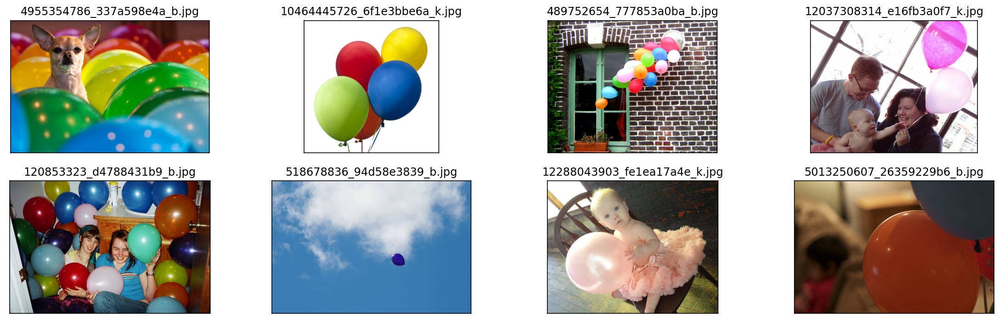

In [10]:
# 数据集可视化

import os
import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

image_paths= [filename for filename in os.listdir('data/balloon/train')][:8]

for i,filename in enumerate(image_paths):
    name = os.path.splitext(filename)[0]

    image = Image.open('data/balloon/train/'+filename).convert("RGB")
  
    plt.subplot(2, 4, i+1)
    plt.imshow(image)
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

数据集转COCO格式，不用自行标注

In [6]:
!python custom2coco.py

coco json可视化

In [18]:
from pycocotools.coco import COCO
import numpy as np
import os.path as osp
import matplotlib.pyplot as plt
from matplotlib.collections import PatchCollection
from matplotlib.patches import Polygon

def apply_exif_orientation(image):
    _EXIF_ORIENT = 274
    if not hasattr(image, 'getexif'):
        return image

    try:
        exif = image.getexif()
    except Exception:
        exif = None

    if exif is None:
        return image

    orientation = exif.get(_EXIF_ORIENT)

    method = {
        2: Image.FLIP_LEFT_RIGHT,
        3: Image.ROTATE_180,
        4: Image.FLIP_TOP_BOTTOM,
        5: Image.TRANSPOSE,
        6: Image.ROTATE_270,
        7: Image.TRANSVERSE,
        8: Image.ROTATE_90,
    }.get(orientation)
    if method is not None:
        return image.transpose(method)
    return image


def show_bbox_only(coco, anns, show_label_bbox=True, is_filling=True):
    """Show bounding box of annotations Only."""
    if len(anns) == 0:
        return

    ax = plt.gca()
    ax.set_autoscale_on(False)

    image2color = dict()
    for cat in coco.getCatIds():
        image2color[cat] = (np.random.random((1, 3)) * 0.7 + 0.3).tolist()[0]

    polygons = []
    colors = []

    for ann in anns:
        color = image2color[ann['category_id']]
        bbox_x, bbox_y, bbox_w, bbox_h = ann['bbox']
        poly = [[bbox_x, bbox_y], [bbox_x, bbox_y + bbox_h],
                [bbox_x + bbox_w, bbox_y + bbox_h], [bbox_x + bbox_w, bbox_y]]
        polygons.append(Polygon(np.array(poly).reshape((4, 2))))
        colors.append(color)

        if show_label_bbox:
            label_bbox = dict(facecolor=color)
        else:
            label_bbox = None

        ax.text(
            bbox_x,
            bbox_y,
            '%s' % (coco.loadCats(ann['category_id'])[0]['name']),
            color='white',
            bbox=label_bbox)

    if is_filling:
        p = PatchCollection(
            polygons, facecolor=colors, linewidths=0, alpha=0.4)
        ax.add_collection(p)
    p = PatchCollection(
        polygons, facecolor='none', edgecolors=colors, linewidths=2)
    ax.add_collection(p)

    
coco = COCO('data/balloon/val/coco_val.json')
image_ids = coco.getImgIds()
print('image_ids[0] = {}'.format(image_ids[0]))
#np.random.shuffle(image_ids)

plt.figure(figsize=(16, 5))

# 只可视化 8 张图片
for i in range(8):
    print('image_ids = {}'.format(image_ids))
    image_data = coco.loadImgs(image_ids[i])[0]
    image_path = osp.join('data/balloon/val/coco_val.json/',image_data['file_name'])
    annotation_ids = coco.getAnnIds(
            imgIds=image_data['id'], catIds=[], iscrowd=0)
    annotations = coco.loadAnns(annotation_ids)
    
    ax = plt.subplot(2, 4, i+1)
    image = Image.open(image_path).convert("RGB")
    
    # 这行代码很关键，否则可能图片和标签对不上
    image=apply_exif_orientation(image)
    
    ax.imshow(image)
    
    show_bbox_only(coco, annotations)
    
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])
        
plt.tight_layout()    

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
image_ids[0] = 24631331976_defa3bb61f_k
image_ids = ['24631331976_defa3bb61f_k', '16335852991_f55de7958d_k', '14898532020_ba6199dd22_k', '8053085540_a72bd21a64_k', '6810773040_3d81036d05_k', '5603212091_2dfe16ea72_b', '5555705118_3390d70abe_b', '4838031651_3e7b5ea5c7_b', '4581425993_72b9b15fc0_b', '3825919971_93fb1ec581_b', '3800636873_ace2c2795f_b', '2917282960_06beee649a_b', '410488422_5f8991f26e_b']


KeyError: '2'

<Figure size 1152x360 with 0 Axes>

# 2 自定义配置文件

In [19]:
# 当前路径位于 mmdetection/tutorials, 配置将写到 mmdetection/tutorials 路径下

config_balloon = """
_base_ = 'configs/rtmdet/rtmdet_tiny_8xb32-300e_coco.py'

data_root = 'data/balloon/'

# 非常重要
metainfo = {
    # 类别名，注意 classes 需要是一个 tuple，因此即使是单类，
    # 你应该写成 `balloon,` 很多初学者经常会在这犯错
    'classes': ('balloon',),
    'palette': [
        (220, 20, 60),
    ]
}
num_classes = 1

# 训练 40 epoch
max_epochs = 40
# 训练单卡 bs= 12
train_batch_size_per_gpu = 12
# 可以根据自己的电脑修改
train_num_workers = 4

# 验证集 batch size 为 1
val_batch_size_per_gpu = 1
val_num_workers = 2

# RTMDet 训练过程分成 2 个 stage，第二个 stage 会切换数据增强 pipeline
num_epochs_stage2 = 5

# batch 改变了，学习率也要跟着改变， 0.004 是 8卡x32 的学习率
base_lr = 12 * 0.004 / (32*8)

# 采用 COCO 预训练权重
load_from = 'https://download.openmmlab.com/mmdetection/v3.0/rtmdet/rtmdet_tiny_8xb32-300e_coco/rtmdet_tiny_8xb32-300e_coco_20220902_112414-78e30dcc.pth'  # noqa

model = dict(
    # 考虑到数据集太小，且训练时间很短，我们把 backbone 完全固定
    # 用户自己的数据集可能需要解冻 backbone
    backbone=dict(frozen_stages=4),
    # 不要忘记修改 num_classes
    bbox_head=dict(dict(num_classes=num_classes)))

# 数据集不同，dataset 输入参数也不一样
train_dataloader = dict(
    batch_size=train_batch_size_per_gpu,
    num_workers=train_num_workers,
    pin_memory=False,
    dataset=dict(
        data_root=data_root,
        metainfo=metainfo,
        ann_file='train/coco_train.json',
        data_prefix=dict(img='train/')))

val_dataloader = dict(
    batch_size=val_batch_size_per_gpu,
    num_workers=val_num_workers,
    dataset=dict(
        metainfo=metainfo,
        data_root=data_root,
        ann_file='val/coco_val.json',
        data_prefix=dict(img='val/')))

test_dataloader = val_dataloader

# 默认的学习率调度器是 warmup 1000，但是 balloon 数据集太小了，需要修改 为 30 iter
param_scheduler = [
    dict(
        type='LinearLR',
        start_factor=1.0e-5,
        by_epoch=False,
        begin=0,
        end=30),
    dict(
        type='CosineAnnealingLR',
        eta_min=base_lr * 0.05,
        begin=max_epochs // 2,  # max_epoch 也改变了
        end=max_epochs,
        T_max=max_epochs // 2,
        by_epoch=True,
        convert_to_iter_based=True),
]
optim_wrapper = dict(optimizer=dict(lr=base_lr))

# 第二 stage 切换 pipeline 的 epoch 时刻也改变了
_base_.custom_hooks[1].switch_epoch = max_epochs - num_epochs_stage2

val_evaluator = dict(ann_file=data_root + 'val/coco_val.json')
test_evaluator = val_evaluator

# 一些打印设置修改
default_hooks = dict(
    checkpoint=dict(interval=10, max_keep_ckpts=5, save_best='auto'),  # 同时保存最好性能权重
    logger=dict(type='LoggerHook', interval=5))
train_cfg = dict(max_epochs=max_epochs, val_interval=10)
"""

with open('rtmdet_tiny_1xb12-40e_balloon.py', 'w') as f:
    f.write(config_balloon)

# 3 训练前可视化验证

我们可以采用 mmdet 提供的 `tools/analysis_tools/browse_dataset.py` 脚本来对训练前的 dataloader 输出进行可视化，确保数据部分没有问题。
考虑到我们仅仅想可视化前几张图片，因此下面基于 browse_dataset.py 实现一个简单版本即可

loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
06/11 22:52:57 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.


/root/autodl-tmp/pythonProject/openmmlab_ai/MMDetection_homework/mmdetection/mmdet/datasets/api_wrappers/coco_api.py:22: UserWarning: mmpycocotools is deprecated. Please install official pycocotools by "pip install pycocotools"
  warnings.warn(
/root/miniconda3/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:757: UserWarning: Warning: The bbox is out of bounds, the drawn bbox may not be in the image
  warnings.warn(
/root/miniconda3/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:828: UserWarning: Warning: The polygon is out of bounds, the drawn polygon may not be in the image
  warnings.warn(


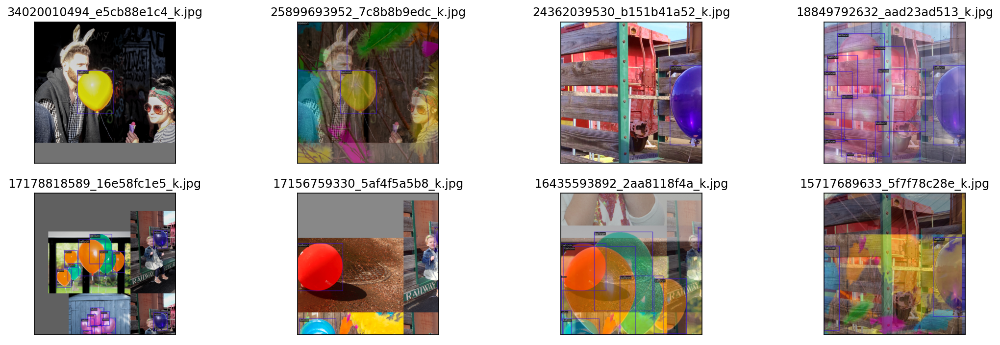

In [20]:
from mmdet.registry import DATASETS, VISUALIZERS
from mmengine.config import Config
from mmengine.registry import init_default_scope

cfg = Config.fromfile('rtmdet_tiny_1xb12-40e_balloon.py')

init_default_scope(cfg.get('default_scope', 'mmdet'))

dataset = DATASETS.build(cfg.train_dataloader.dataset)
visualizer = VISUALIZERS.build(cfg.visualizer)
visualizer.dataset_meta = dataset.metainfo

plt.figure(figsize=(16, 5))

# 只可视化前 8 张图片
for i in range(8):
   item=dataset[i]

   img = item['inputs'].permute(1, 2, 0).numpy()
   data_sample = item['data_samples'].numpy()
   gt_instances = data_sample.gt_instances
   img_path = osp.basename(item['data_samples'].img_path)

   gt_bboxes = gt_instances.get('bboxes', None)
   gt_instances.bboxes = gt_bboxes.tensor
   data_sample.gt_instances = gt_instances

   visualizer.add_datasample(
            osp.basename(img_path),
            img,
            data_sample,
            draw_pred=False,
            show=False)
   drawed_image=visualizer.get_image()

   plt.subplot(2, 4, i+1)
   plt.imshow(drawed_image[..., [2, 1, 0]])
   plt.title(f"{osp.basename(img_path)}")
   plt.xticks([])
   plt.yticks([])

plt.tight_layout()    

# 4 模型训练

在验证数据流本身没有问题后，就可以开始进行训练了

In [21]:
!python tools/train.py rtmdet_tiny_1xb12-40e_balloon.py

06/11 22:55:10 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.10 (default, Jun  4 2021, 15:09:15) [GCC 7.5.0]
    CUDA available: True
    numpy_random_seed: 891950947
    GPU 0: Tesla T4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.3, V11.3.109
    GCC: gcc (Ubuntu 9.3.0-17ubuntu1~20.04) 9.3.0
    PyTorch: 1.10.0+cu113
    PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191122 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.2.3 (Git Hash 7336ca9f055cf1bfa13efb658fe15dc9b41f0740)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX512
  - CUDA Runtime 11.3
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-genco

# 5 模型测试

设置 --show-dir 将测试图片的真实值和预测值保存下来，然后进行深入分析。

In [23]:
!python tools/test.py rtmdet_tiny_1xb12-40e_balloon.py work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_30.pth --show-dir results

06/11 23:08:21 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.8.10 (default, Jun  4 2021, 15:09:15) [GCC 7.5.0]
    CUDA available: True
    numpy_random_seed: 944325958
    GPU 0: Tesla T4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 11.3, V11.3.109
    GCC: gcc (Ubuntu 9.3.0-17ubuntu1~20.04) 9.3.0
    PyTorch: 1.10.0+cu113
    PyTorch compiling details: PyTorch built with:
  - GCC 7.3
  - C++ Version: 201402
  - Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191122 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.2.3 (Git Hash 7336ca9f055cf1bfa13efb658fe15dc9b41f0740)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX512
  - CUDA Runtime 11.3
  - NVCC architecture flags: -gencode;arch=compute_37,code=sm_37;-gencode;arch=compute_50,code=sm_50;-genco

会在 `work_dirs/rtmdet_tiny_1xb12-40e_balloon/20230611_230820/results/` 下生成测试图片，下面对前 8 张图片进行可视化

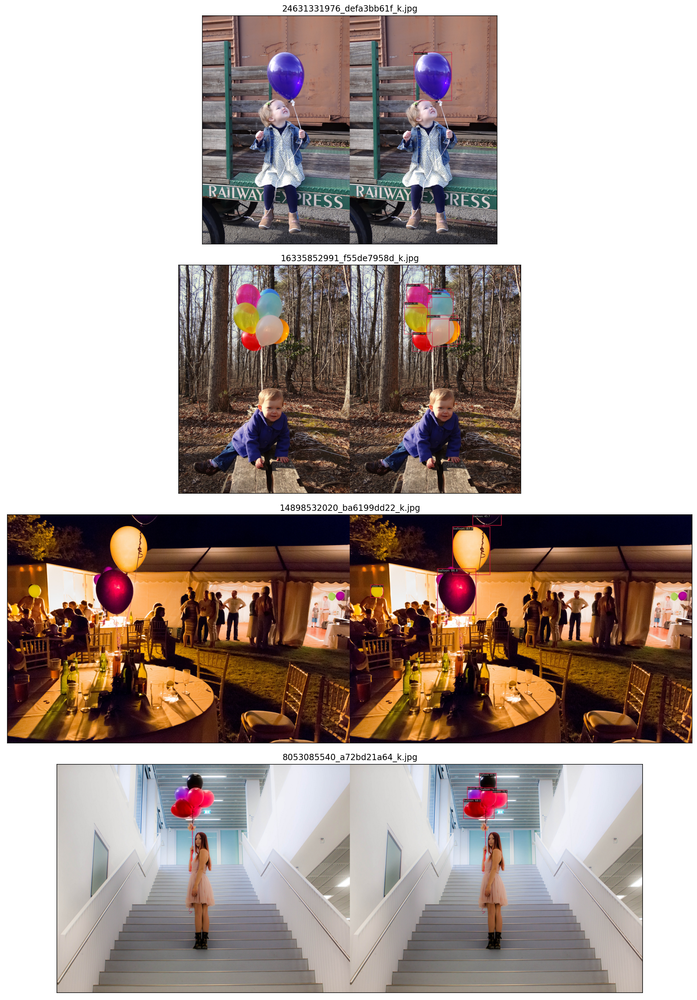

In [24]:
# 数据集可视化

import os
import matplotlib.pyplot as plt
from PIL import Image

%matplotlib inline

plt.figure(figsize=(20, 20))

# 你如果重新跑，这个时间戳是不一样的，需要自己修改
root_path='work_dirs/rtmdet_tiny_1xb12-40e_balloon/20230611_230820/results/'
image_paths= [filename for filename in os.listdir(root_path)][:4]

for i,filename in enumerate(image_paths):
    name = os.path.splitext(filename)[0]

    image = Image.open(root_path+filename).convert("RGB")
  
    plt.subplot(4, 1, i+1)
    plt.imshow(image)
    plt.title(f"{filename}")
    plt.xticks([])
    plt.yticks([])

plt.tight_layout()

# 6 可视化分析

可视化分析包括特征图可视化以及类似 Grad CAM 等可视化分析手段。不过由于 MMDetection 中还没有实现，我们可以直接采用 MMYOLO 中提供的功能和脚本。MMYOLO 是基于 MMDetection 开发，并且此案有了统一的代码组织形式，因此 MMDetection 配置可以直接在 MMYOLO 中使用，无需更改配置。

## MMYOLO 环境和依赖安装

In [27]:
#!pwd
#%cd ../
#!rm -rf mmyolo
# 为了防止后续更新导致的可能无法运行，特意新建了 tutorials 分支
!git clone -b tutorials https://github.com/open-mmlab/mmyolo.git 
%cd mmyolo

%pip install -e .
!pwd

Cloning into 'mmyolo'...
remote: Enumerating objects: 4898, done.
remote: Counting objects: 100% (289/289), done.
remote: Compressing objects: 100% (179/179), done.
remote: Total 4898 (delta 122), reused 221 (delta 105), pack-reused 4609
Receiving objects: 100% (4898/4898), 3.76 MiB | 9.65 MiB/s, done.
Resolving deltas: 100% (3006/3006), done.
/root/autodl-tmp/pythonProject/openmmlab_ai/MMDetection_homework/mmyolo
Looking in indexes: http://mirrors.aliyun.com/pypi/simple
Obtaining file:///root/autodl-tmp/pythonProject/openmmlab_ai/MMDetection_homework/mmyolo
  Running setup.py develop for mmyolo
Note: you may need to restart the kernel to use updated packages.
/root/autodl-tmp/pythonProject/openmmlab_ai/MMDetection_homework/mmyolo


## 特征图可视化

MMYOLO 中，将使用 MMEngine 提供的 `Visualizer` 可视化器进行特征图可视化，其具备如下功能：

- 支持基础绘图接口以及特征图可视化。
- 支持选择模型中的不同层来得到特征图，包含 `squeeze_mean` ， `select_max` ， `topk` 三种显示方式，用户还可以使用 `arrangement` 自定义特征图显示的布局方式。

你可以调用 `demo/featmap_vis_demo.py` 来简单快捷地得到可视化结果，为了方便理解，将其主要参数的功能梳理如下：

- `img`：选择要用于特征图可视化的图片，支持单张图片或者图片路径列表。

- `config`：选择算法的配置文件。

- `checkpoint`：选择对应算法的权重文件。

- `--out-file`：将得到的特征图保存到本地，并指定路径和文件名。

- `--device`：指定用于推理图片的硬件，`--device cuda：0`  表示使用第 1 张 GPU 推理，`--device cpu` 表示用 CPU 推理。

- `--score-thr`：设置检测框的置信度阈值，只有置信度高于这个值的框才会显示。

- `--preview-model`：可以预览模型，方便用户理解模型的特征层结构。

- `--target-layers`：对指定层获取可视化的特征图。

  - 可以单独输出某个层的特征图，例如： `--target-layers backbone` ,  `--target-layers neck` ,  `--target-layers backbone.stage4` 等。
  - 参数为列表时，也可以同时输出多个层的特征图，例如： `--target-layers backbone.stage4 neck` 表示同时输出 backbone 的 stage4 层和 neck 的三层一共四层特征图。

- `--channel-reduction`：输入的 Tensor 一般是包括多个通道的，`channel_reduction` 参数可以将多个通道压缩为单通道，然后和图片进行叠加显示，有以下三个参数可以设置：

  - `squeeze_mean`：将输入的 C 维度采用 mean 函数压缩为一个通道，输出维度变成 (1, H, W)。
  - `select_max`：将输入先在空间维度 sum，维度变成 (C, )，然后选择值最大的通道。
  - `None`：表示不需要压缩，此时可以通过 `topk` 参数可选择激活度最高的 `topk` 个特征图显示。

- `--topk`：只有在 `channel_reduction` 参数为 `None` 的情况下， `topk` 参数才会生效，其会按照激活度排序选择 `topk` 个通道，然后和图片进行叠加显示，并且此时会通过 `--arrangement` 参数指定显示的布局，该参数表示为一个数组，两个数字需要以空格分开，例如： `--topk 5 --arrangement 2 3` 表示以 `2行 3列` 显示激活度排序最高的 5 张特征图， `--topk 7 --arrangement 3 3` 表示以 `3行 3列` 显示激活度排序最高的 7 张特征图。

  - 如果 topk 不是 -1，则会按照激活度排序选择 topk 个通道显示。
  - 如果 topk = -1，此时通道 C 必须是 1 或者 3 表示输入数据是图片，否则报错提示用户应该设置 `channel_reduction` 来压缩通道。

- 考虑到输入的特征图通常非常小，函数默认将特征图进行上采样后方便进行可视化。

**注意：当图片和特征图尺度不一样时候，`draw_featmap` 函数会自动进行上采样对齐。如果你的图片在推理过程中前处理存在类似 Pad 的操作此时得到的特征图也是 Pad 过的，那么直接上采样就可能会出现不对齐问题。**


我们计划采用网上找的气球图片存放在 data/some_balloons.jpg 进行后续可视化分析，不过由于这张图片分辨率过大，会导致程序奔溃，因此我们先将其缩放处理

In [29]:
import cv2

img = cv2.imread('../mmdetection/data/some_balloons.jpg')
h,w=img.shape[:2]
resized_img = cv2.resize(img, (640, 640))
cv2.imwrite('resized_image.jpg', resized_img)

True

**1. 可视化 backbone 输出的 3 个通道**

Loads checkpoint by local backend from path: ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_30.pth
06/11 23:43:38 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
[                                                  ] 0/1, elapsed: 0s, ETA:/root/miniconda3/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/root/miniconda3/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:984: UserWarning: Since the spatial dimensions of overlaid_image: (640, 640) and featmap: torch.Size([80, 80]) are not same, the feature map will be interpolated. This may cause mismatch problems ！
  warnings.warn(
/root/miniconda3/lib/python3.8/site-packages/mmengine/visualization/visual

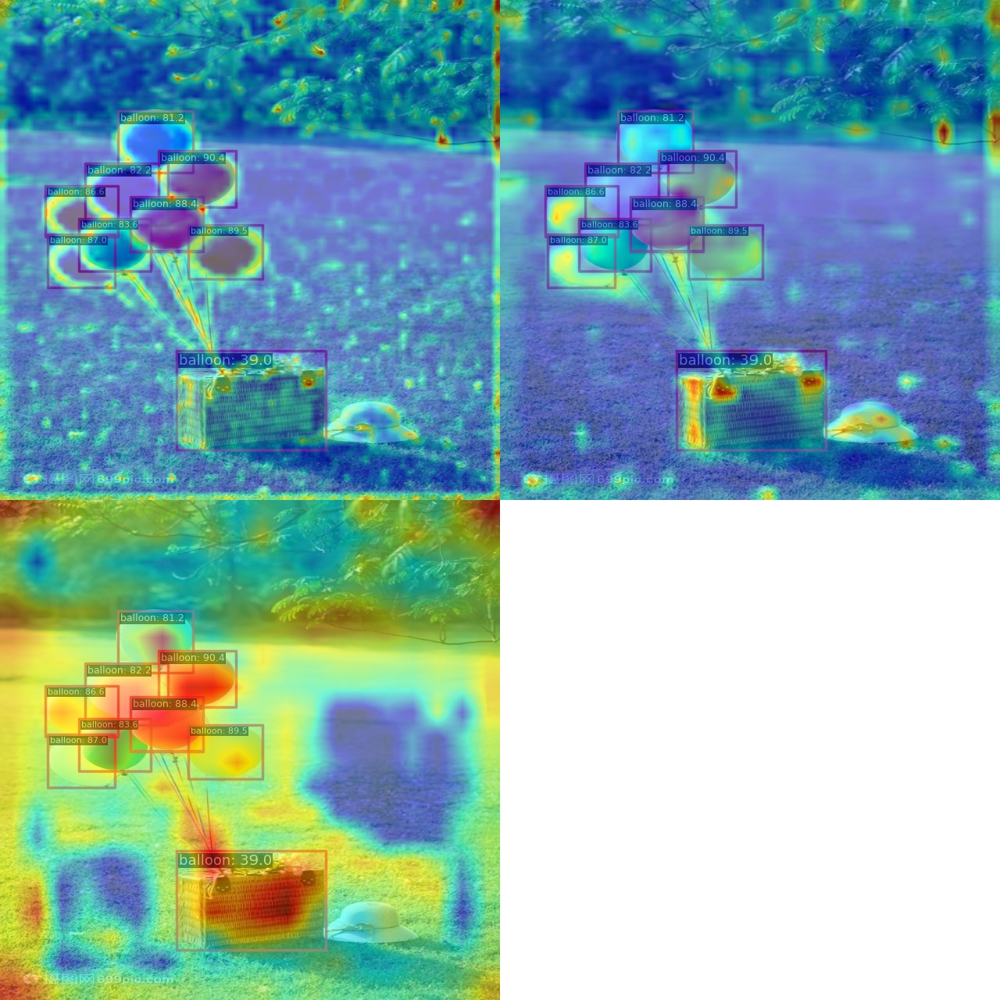

In [30]:
!python demo/featmap_vis_demo.py \
      resized_image.jpg \
      ../mmdetection/rtmdet_tiny_1xb12-40e_balloon.py \
      ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_30.pth  \
      --target-layers backbone  
      --channel-reduction squeeze_mean
Image.open('output/resized_image.jpg')   

上图中绘制的 3 个输出特征图对应大中小输出特征图。由于本次训练的 backbone 实际上没有参与训练，从上图可以看到，大物体 balloon 是在小特征图进行预测，这符合目标检测分层检测思想。

**2. 可视化 neck 输出的 3 个通道**

Loads checkpoint by local backend from path: ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_30.pth
06/11 23:51:17 - mmengine - WARNING - `Visualizer` backend is not initialized because save_dir is None.
[                                                  ] 0/1, elapsed: 0s, ETA:/root/miniconda3/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/root/miniconda3/lib/python3.8/site-packages/mmengine/visualization/visualizer.py:984: UserWarning: Since the spatial dimensions of overlaid_image: (640, 640) and featmap: torch.Size([80, 80]) are not same, the feature map will be interpolated. This may cause mismatch problems ！
  warnings.warn(
/root/miniconda3/lib/python3.8/site-packages/mmengine/visualization/visual

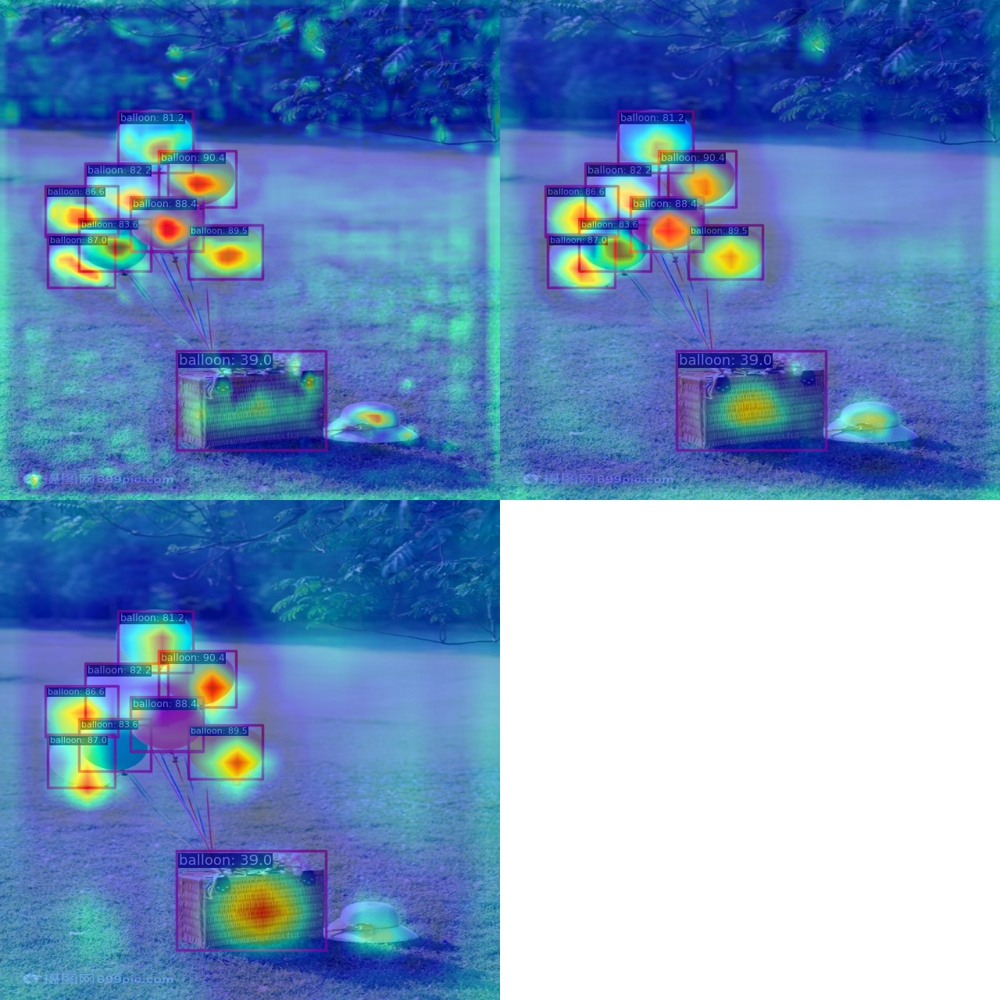

In [33]:
!python demo/featmap_vis_demo.py \
      resized_image.jpg \
      ../mmdetection/rtmdet_tiny_1xb12-40e_balloon.py \
      ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_30.pth  \
      --target-layers neck  \
      --channel-reduction squeeze_mean
Image.open('output/resized_image.jpg') 

从上图可以看出，由于 neck 是参与训练的，并且 FPN 间的信息融合导致输出特征图更加聚集

## Grad-Based CAM 可视化

由于目标检测的特殊性，这里实际上可视化的并不是 CAM 而是 Grad Box AM。使用前需要先安装 grad-cam 库


In [34]:
!pip install "grad-cam"

Looking in indexes: http://mirrors.aliyun.com/pypi/simple
     |████████████████████████████████| 7.8 MB 2.5 MB/s eta 0:00:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for grad-cam: filename=grad_cam-1.4.6-py3-none-any.whl size=38241 sha256=94a188b22095af24d69a01acc733c21a7c7310bdecbad75fc6c74a65fb61389c
  Stored in directory: /root/.cache/pip/wheels/43/0f/9f/ec82f3762a03d52c16616a97500ad7aad94615642fde6b1680
Successfully built grad-cam


**(a) 查看 neck 输出的最小输出特征图的 Grad CAM**

The algorithm currently used is rtmdet
Loads checkpoint by local backend from path: ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_30.pth
[                                                  ] 0/1, elapsed: 0s, ETA:/root/miniconda3/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/root/miniconda3/lib/python3.8/site-packages/torch/nn/functional.py:3631: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn(
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1/1, 1.5 task/s, elapsed: 1s, ETA:     0sAll done!
Results have been saved at /root/

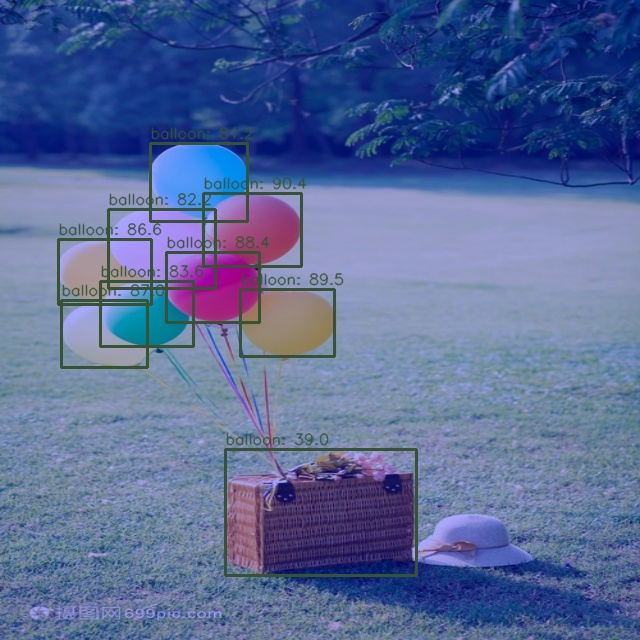

In [35]:
!python demo/boxam_vis_demo.py \
      resized_image.jpg \
      ../mmdetection/rtmdet_tiny_1xb12-40e_balloon.py \
      ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_30.pth  \
      --target-layer neck.out_convs[2]
Image.open('output/resized_image.jpg')     

可以看出效果较好

**(b) 查看 neck 输出的最大输出特征图的 Grad CAM**

The algorithm currently used is rtmdet
Loads checkpoint by local backend from path: ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_30.pth
[                                                  ] 0/1, elapsed: 0s, ETA:/root/miniconda3/lib/python3.8/site-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/root/miniconda3/lib/python3.8/site-packages/torch/nn/functional.py:3631: UserWarning: Default upsampling behavior when mode=bilinear is changed to align_corners=False since 0.4.0. Please specify align_corners=True if the old behavior is desired. See the documentation of nn.Upsample for details.
  warnings.warn(
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 1/1, 4.3 task/s, elapsed: 0s, ETA:     0sAll done!
Results have been saved at /root/

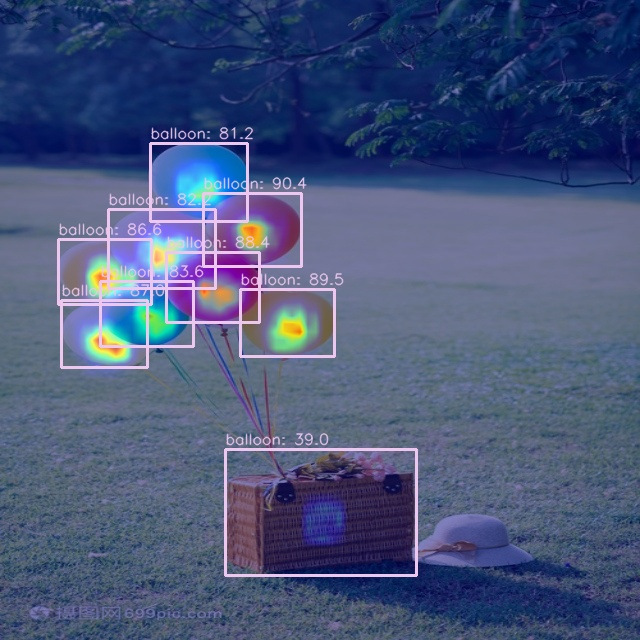

In [36]:
!python demo/boxam_vis_demo.py \
      resized_image.jpg \
      ../mmdetection/rtmdet_tiny_1xb12-40e_balloon.py \
      ../mmdetection/work_dirs/rtmdet_tiny_1xb12-40e_balloon/best_coco_bbox_mAP_epoch_30.pth  \
      --target-layer neck.out_convs[0]
Image.open('output/resized_image.jpg')     

可以发现由于大物体不会在该层预测，因此梯度可视化是 0，符合预期。